# Import Lib

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Read Data by Sektor

In [ ]:
df_cnbc = pd.read_excel('/data/Data Preprocessing/Data Teks/new_all_completed_data_cnbc.xlsx')
df_kontan = pd.read_excel('/data/Data Preprocessing/Data Teks/new_all_completed_data_kontan.xlsx')

In [ ]:
print(df_cnbc.info())
print(df_kontan.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47531 entries, 0 to 47530
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Title             47531 non-null  object        
 1   Link              47531 non-null  object        
 2   Date              47531 non-null  datetime64[ns]
 3   Content           47531 non-null  object        
 4   Title_Translated  47531 non-null  object        
 5   Sektor            47531 non-null  object        
 6   Matched Keywords  47531 non-null  object        
dtypes: datetime64[ns](1), object(6)
memory usage: 2.5+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75074 entries, 0 to 75073
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Judul             75074 non-null  object        
 1   Tanggal           75074 non-null  datetime64[ns]
 2   Title_Transla

In [ ]:
df_cnbc["Sektor"].value_counts()

,count
Sektor,
G,13938
All Sector,7939
Internasional,5780
A,3707
B,3279
J,2065
D,1934
H,1873
E,1478


In [ ]:
df_kontan["Sektor"].value_counts()

,count
Sektor,
All Sector,17320
Unknown,13794
B,10010
A,6092
Internasional,5456
G,4655
J,3755
D,3712
E,2454


# Buat df Per Sektor

In [ ]:
sektor_list = df_cnbc["Sektor"].unique()
dict_cnbc = {}

for sektor in sektor_list:
  dict_cnbc[sektor] = df_cnbc[df_cnbc["Sektor"] == sektor]

In [ ]:
sektor_list = df_kontan["Sektor"].unique()
dict_kontan = {}

for sektor in sektor_list:
  dict_kontan[sektor] = df_kontan[df_kontan["Sektor"] == sektor]

In [ ]:
dict_cnbc.keys()

dict_keys(['Internasional', 'All Sector', 'B', 'D', 'F', 'G', 'A', 'J', 'I', 'Obligasi', 'Unknown', 'H', 'E', 'C', 'K'])

In [ ]:
dict_kontan["A"] = dict_kontan["A"].sort_values(by="Tanggal")
dict_kontan["A"].to_excel("df_AA.xlsx")


In [ ]:
dict_cnbc["A"]

,Title,Link,Date,Content,Title_Translated,Sektor,Matched Keywords
22,Prospek 2021 Minyak Mentah Stabil Batu Bara La...,https://www.cnbcindonesia.com/market/202101021...,2021-01-02 17:05:00,"Jakarta, CNBC Indonesia- Harga komoditas seper...","2021 Outlook, Crude Oil Steady, Coal Continues...",A,"['minyak mentah', 'batu bara']"
27,Siapsiap Tahun 2021 Harga Komoditas Tambang Ba...,https://www.cnbcindonesia.com/market/202101030...,2021-01-03 09:50:00,"Jakarta, CNBC Indonesia -Babak baru tahun 2021...","Get ready, in 2021 the price of mining commodi...",A,['tambang']
36,Sempat Merah Ini Saham yang Bertarung Bikin IH...,https://www.cnbcindonesia.com/market/202101041...,2021-01-04 10:07:00,"Jakarta, CNBC Indonesia- Indeks Harga Saham Ga...","Once Red, These Are the Stocks That Are Fighti...",A,"['INDY', 'ITMG', 'TLKM', 'ISAT', 'TLKM', 'ISAT..."
44,Selamat INDY Ikut Menang Tender Bareng CT Corp...,https://www.cnbcindonesia.com/market/202101041...,2021-01-04 11:22:00,"Jakarta, CNBC Indonesia -Anak usaha PT Indika ...",Congratulations! INDY Wins Tender with CT Corp...,A,['INDY']
56,AS Boikot Lagi Sawit Malaysia Anak Perusahaann...,https://www.cnbcindonesia.com/market/202101041...,2021-01-04 13:55:00,"Jakarta, CNBC Indonesia- Pemerintah Amerika Se...","US Again Boycotts Malaysian Palm Oil, Its Subs...",A,"['minyak', 'cpo', 'cpo', 'minyak sawit', 'miny..."
...,...,...,...,...,...,...,...
47426,Donald Trump Buka Suara Harga Minyak Kompak Am...,https://www.cnbcindonesia.com/market/202501270...,2025-01-27 09:49:00,"Jakarta, CNBC Indonesia -Harga minyak mentah d...","Donald Trump Speaks Out, Oil Prices Collapse 1%",A,['minyak']
47440,Harga Minyak Belum Bisa Bangkit dari KuburMasi...,https://www.cnbcindonesia.com/market/202501281...,2025-01-28 13:45:00,"Jakarta, CNBC Indonesia -Harga minyak mentah d...",Oil Prices Still Can't Rise from the Grave - S...,A,['minyak']
47444,Investor Pelototi TandaTanda dari AS Harga Min...,https://www.cnbcindonesia.com/market/202501291...,2025-01-29 10:53:00,"Jakarta, CNBC Indonesia -Harga minyak mentah d...","Investors Eye Signs from US, Oil Prices Tend t...",A,['minyak']
47508,Pasar Penuh Ketidakpastian Dolar Dibuka Mengua...,https://www.cnbcindonesia.com/market/202501310...,2025-01-31 09:15:00,"Jakarta, CNBC Indonesia -Nilai tukar rupiah te...","Market Full of Uncertainty, Dollar Opens Stron...",A,"['minyak', 'gedung', 'bank', 'bunga', 'bunga',..."


# Menambahkan Berita Kategori 'All Sector' ke Semua Sektor  

In [ ]:
for sektor in dict_cnbc:
    if sektor != "All Sector":  # Hindari menambahkan ke dirinya sendiri
        dict_cnbc[sektor] = pd.concat([dict_cnbc[sektor], dict_cnbc["All Sector"]], ignore_index=True)

In [ ]:
for sektor in dict_kontan:
    if sektor != "All Sector":  # Hindari menambahkan ke dirinya sendiri
        dict_kontan[sektor] = pd.concat([dict_kontan[sektor], dict_kontan["All Sector"]], ignore_index=True)

# Hitung Jumlah Berita Per Sektor

In [ ]:
for sektor, df_sektor in dict_cnbc.items():
    print(f"Jumlah data di sektor {sektor}: {len(df_sektor)}")

Jumlah data di sektor Internasional: 5780
Jumlah data di sektor All Sector: 7939
Jumlah data di sektor B: 3279
Jumlah data di sektor D: 1934
Jumlah data di sektor F: 692
Jumlah data di sektor G: 13938
Jumlah data di sektor A: 3707
Jumlah data di sektor J: 2065
Jumlah data di sektor I: 1453
Jumlah data di sektor Obligasi: 695
Jumlah data di sektor Unknown: 1107
Jumlah data di sektor H: 1873
Jumlah data di sektor E: 1478
Jumlah data di sektor C: 650
Jumlah data di sektor K: 941


In [ ]:
for sektor, df_sektor in dict_kontan.items():
    print(f"Jumlah data di sektor {sektor}: {len(df_sektor)}")

Jumlah data di sektor A: 6092
Jumlah data di sektor Internasional: 5456
Jumlah data di sektor B: 10010
Jumlah data di sektor All Sector: 17320
Jumlah data di sektor Unknown: 13794
Jumlah data di sektor J: 3755
Jumlah data di sektor D: 3712
Jumlah data di sektor C: 1576
Jumlah data di sektor G: 4655
Jumlah data di sektor I: 1527
Jumlah data di sektor E: 2454
Jumlah data di sektor H: 1854
Jumlah data di sektor K: 736
Jumlah data di sektor F: 1288
Jumlah data di sektor Obligasi: 845


In [ ]:
dict_cnbc["G"].info()

<class 'pandas.core.frame.DataFrame'>
Index: 13938 entries, 16 to 47530
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Title             13938 non-null  object        
 1   Link              13938 non-null  object        
 2   Date              13938 non-null  datetime64[ns]
 3   Content           13938 non-null  object        
 4   Title_Translated  13938 non-null  object        
 5   Sektor            13938 non-null  object        
 6   Matched Keywords  13938 non-null  object        
dtypes: datetime64[ns](1), object(6)
memory usage: 871.1+ KB


# Hitung Jumlah Berita per Hari

In [ ]:
df_cnbc["Only_Date"] = df_cnbc["Date"].dt.date
per_day_cnbc = df_cnbc["Only_Date"].value_counts().reset_index()
per_day_cnbc.columns = ["Date", "News Count"]
per_day_cnbc = per_day_cnbc.sort_values("Date")
per_day_cnbc = per_day_cnbc.reset_index(drop=True)

print(per_day_cnbc)
print("Total Berita:")
per_day_cnbc["News Count"].sum()

            Date  News Count
0     2021-01-01          15
1     2021-01-02          12
2     2021-01-03           6
3     2021-01-04          37
4     2021-01-05          35
...          ...         ...
1487  2025-01-27          14
1488  2025-01-28           8
1489  2025-01-29          12
1490  2025-01-30          43
1491  2025-01-31          33

[1492 rows x 2 columns]
Total Berita:


47531

In [ ]:
df_kontan["Only_Date"] = df_kontan["Tanggal"].dt.date
per_day_kontan = df_kontan["Only_Date"].value_counts().reset_index()
per_day_kontan.columns = ["Tanggal", "News Count"]
per_day_kontan = per_day_kontan.sort_values("Tanggal")
per_day_kontan = per_day_kontan.reset_index(drop=True)

print(per_day_kontan)
print("Total Berita:")
per_day_kontan["News Count"].sum()

         Tanggal  News Count
0     2021-01-25          55
1     2021-01-26          67
2     2021-01-27          72
3     2021-01-28          64
4     2021-01-29          56
...          ...         ...
1463  2025-01-27          34
1464  2025-01-28          28
1465  2025-01-29          32
1466  2025-01-30          53
1467  2025-01-31          58

[1468 rows x 2 columns]
Total Berita:


75074

In [ ]:
print(per_day_cnbc.describe())
print("-----------------------")
print(per_day_kontan.describe())

        News Count
count  1492.000000
mean     31.857239
std      14.637461
min       3.000000
25%      16.000000
50%      38.000000
75%      43.000000
max      98.000000
-----------------------
        News Count
count  1468.000000
mean     51.140327
std      23.486745
min       2.000000
25%      26.000000
50%      60.000000
75%      70.000000
max     102.000000


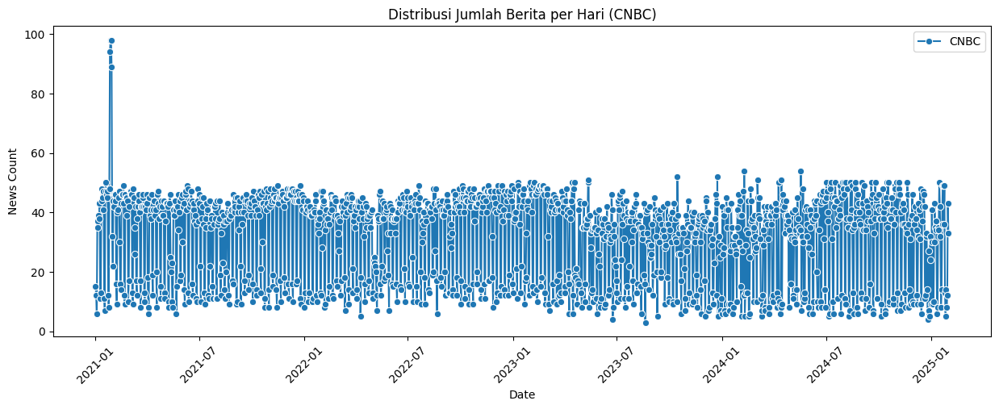

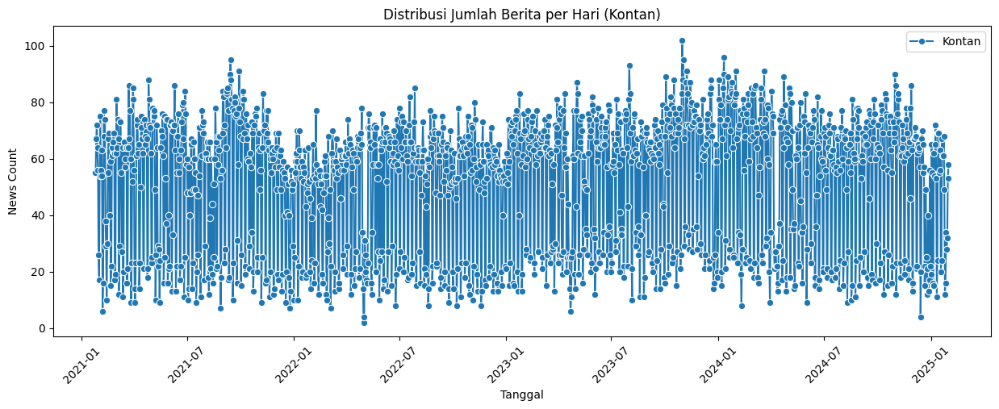

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualisasi untuk per_day_cnbc
plt.figure(figsize=(15, 5))
sns.lineplot(data=per_day_cnbc, x="Date", y="News Count", marker="o", label="CNBC")
plt.xticks(rotation=45)
plt.title("Distribusi Jumlah Berita per Hari (CNBC)")
plt.show()

# Visualisasi untuk per_day_kontan
plt.figure(figsize=(15, 5))
sns.lineplot(data=per_day_kontan, x="Tanggal", y="News Count", marker="o", label="Kontan")
plt.xticks(rotation=45)
plt.title("Distribusi Jumlah Berita per Hari (Kontan)")
plt.show()

# Jumlah Berita Per Hari Setiap Sektor

In [ ]:
for sektor, df_sektor in dict_cnbc.items():
    # Menggunakan .copy() untuk membuat salinan DataFrame
    df_sektor_copy = df_sektor.copy()

    df_sektor_copy["Only_Date"] = df_sektor_copy["Date"].dt.date
    news_per_day = df_sektor_copy["Only_Date"].value_counts().reset_index()
    news_per_day.columns = ["Date", "News Count"]
    news_per_day = news_per_day.sort_values("Date")

    print(f"Distribusi berita CNBC sektor {sektor}:")
    print(news_per_day.head(), "\n")

Distribusi berita CNBC sektor Internasional:
            Date  News Count
422   2021-01-01           5
1029  2021-01-02           2
1231  2021-01-03           1
487   2021-01-04           5
489   2021-01-05           5 

Distribusi berita CNBC sektor All Sector:
            Date  News Count
504   2021-01-01           7
1114  2021-01-02           2
1185  2021-01-03           1
95    2021-01-04          12
167   2021-01-05          10 

Distribusi berita CNBC sektor B:
            Date  News Count
562   2021-01-01           2
1089  2021-01-02           1
346   2021-01-04           3
831   2021-01-06           2
332   2021-01-07           3 

Distribusi berita CNBC sektor D:
           Date  News Count
712  2021-01-01           1
104  2021-01-04           3
823  2021-01-05           1
190  2021-01-06           3
824  2021-01-07           1 

Distribusi berita CNBC sektor F:
           Date  News Count
280  2021-01-02           1
389  2021-01-03           1
352  2021-01-04           1
351 

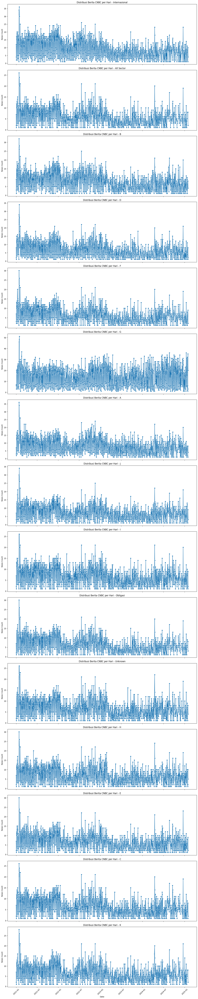

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

num_sectors = len(dict_cnbc)  # Hitung jumlah sektor
fig, axes = plt.subplots(num_sectors, 1, figsize=(15, 5 * num_sectors), sharex=True)  # Buat subplot

# Kalau cuma satu sektor, axes harus dijadikan list dulu
if num_sectors == 1:
    axes = [axes]

for ax, (sektor, df_sektor) in zip(axes, dict_cnbc.items()):
    # Menggunakan .copy() untuk membuat salinan DataFrame
    df_sektor_copy = df_sektor.copy()

    # Menggunakan .loc untuk mengubah salinan DataFrame
    df_sektor_copy.loc[:, "Only_Date"] = df_sektor_copy["Date"].dt.date  # Ambil tanggal saja

    news_per_day = df_sektor_copy["Only_Date"].value_counts().reset_index()
    news_per_day.columns = ["Date", "News Count"]
    news_per_day = news_per_day.sort_values("Date")

    sns.lineplot(data=news_per_day, x="Date", y="News Count", marker="o", ax=ax)
    ax.set_title(f"Distribusi Berita CNBC per Hari - {sektor}")
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
for sektor, df_sektor in dict_kontan.items():
    # Menggunakan .copy() untuk membuat salinan DataFrame
    df_sektor_copy = df_sektor.copy()

    df_sektor_copy["Only_Date"] = df_sektor_copy["Tanggal"].dt.date
    news_per_day = df_sektor_copy["Only_Date"].value_counts().reset_index()
    news_per_day.columns = ["Tanggal", "News Count"]
    news_per_day = news_per_day.sort_values("Tanggal")

    print(f"Distribusi berita Kontan sektor {sektor}:")
    print(news_per_day.head(), "\n")

Distribusi berita Kontan sektor A:
        Tanggal  News Count
861  2021-01-25           3
755  2021-01-26           4
770  2021-01-27           4
750  2021-01-28           4
976  2021-01-29           2 

Distribusi berita Kontan sektor Internasional:
         Tanggal  News Count
1032  2021-01-25           2
528   2021-01-26           4
467   2021-01-27           5
818   2021-01-28           3
356   2021-01-29           5 

Distribusi berita Kontan sektor B:
         Tanggal  News Count
197   2021-01-25          11
479   2021-01-26           8
858   2021-01-27           5
1008  2021-01-28           4
862   2021-01-29           5 

Distribusi berita Kontan sektor All Sector:
        Tanggal  News Count
271  2021-01-25          18
536  2021-01-26          15
214  2021-01-27          19
7    2021-01-28          26
42   2021-01-29          22 

Distribusi berita Kontan sektor Unknown:
        Tanggal  News Count
713  2021-01-25           9
319  2021-01-26          14
60   2021-01-27       

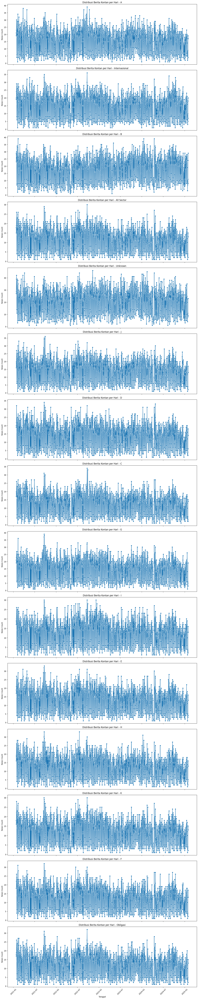

In [ ]:
num_sectors = len(dict_kontan)  # Hitung jumlah sektor
fig, axes = plt.subplots(num_sectors, 1, figsize=(15, 5 * num_sectors), sharex=True)  # Buat subplot

# Kalau cuma satu sektor, axes harus dijadikan list dulu
if num_sectors == 1:
    axes = [axes]

for ax, (sektor, df_sektor) in zip(axes, dict_kontan.items()):
    # Menggunakan .copy() untuk membuat salinan DataFrame
    df_sektor_copy = df_sektor.copy()

    # Menggunakan .loc untuk mengubah salinan DataFrame
    df_sektor_copy.loc[:, "Only_Date"] = df_sektor_copy["Tanggal"].dt.date  # Ambil tanggal saja

    news_per_day = df_sektor_copy["Only_Date"].value_counts().reset_index()
    news_per_day.columns = ["Tanggal", "News Count"]
    news_per_day = news_per_day.sort_values("Tanggal")

    sns.lineplot(data=news_per_day, x="Tanggal", y="News Count", marker="o", ax=ax)
    ax.set_title(f"Distribusi Berita Kontan per Hari - {sektor}")
    ax.tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()

# Mencari Hari Tanpa Berita

In [ ]:
# Buat rentang tanggal dari 1 Jan 2021 sampai 31 Des 2024
full_date_range = pd.date_range(start="2021-01-01", end="2024-12-31", freq="D")

# Ambil hanya tanggal (tanpa jam) dari kolom "Date" di DataFrame
df_cnbc["Only_Date"] = df_cnbc["Date"].dt.date

# Buat DataFrame dengan semua tanggal yang seharusnya ada
full_dates_df = pd.DataFrame(full_date_range, columns=["Only_Date"])

# Gabungkan df yang ada dengan full_dates_df untuk mencari tanggal yang terlewat
missing_dates_df = full_dates_df[~full_dates_df["Only_Date"].isin(df_cnbc["Only_Date"])]

# Cek jika ada tanggal yang hilang
if not missing_dates_df.empty:
    print("Tanggal yang terlewat:")
    print(missing_dates_df)
else:
    print("Tidak ada tanggal yang terlewat!")


Tidak ada tanggal yang terlewat!


<ipython-input-22-6f162443c810>:11: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  missing_dates_df = full_dates_df[~full_dates_df["Only_Date"].isin(df_cnbc["Only_Date"])]


In [ ]:
# Buat rentang tanggal dari 1 Jan 2021 sampai 31 Des 2024
full_date_range = pd.date_range(start="2021-01-01", end="2024-12-31", freq="D")

# Ambil hanya tanggal (tanpa jam) dari kolom "Date" di DataFrame
df_kontan["Only_Date"] = df_kontan["Tanggal"].dt.date

# Buat DataFrame dengan semua tanggal yang seharusnya ada
full_dates_df = pd.DataFrame(full_date_range, columns=["Only_Date"])

# Gabungkan df yang ada dengan full_dates_df untuk mencari tanggal yang terlewat
missing_dates_df = full_dates_df[~full_dates_df["Only_Date"].isin(df_cnbc["Only_Date"])]

# Cek jika ada tanggal yang hilang
if not missing_dates_df.empty:
    print("Tanggal yang terlewat:")
    print(missing_dates_df)
else:
    print("Tidak ada tanggal yang terlewat!")


Tidak ada tanggal yang terlewat!


<ipython-input-23-835fbfc28fff>:11: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  missing_dates_df = full_dates_df[~full_dates_df["Only_Date"].isin(df_cnbc["Only_Date"])]


# Read Data Numerikal

In [ ]:
paths = [
    "/data/A_data.csv",
    "/data/B_data.csv",
    "/data/C_data.csv",
    "/data/D_data.csv",
    "/data/E_data.csv",
    "/data/F_data.csv",
    "/data/G_data.csv",
    "/data//H_data.csv",
    "/data/I_data.csv",
    "/data/J_data.csv",
    "/data/K_data.csv"
]

variables = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K"]

df_saham = {var: pd.read_csv(path) for var, path in zip(variables, paths)}

for key, df in df_saham.items():
    # Ubah kolom 'Tanggal' ke datetime
    df['Tanggal'] = pd.to_datetime(df['Tanggal'])

    # Rename kolom "# Stock" agar lebih mudah diakses
    df = df.rename(columns={'# Stock': 'Stock'})

    # Pastikan tipe data sesuai
    df = df.astype({
        'Sebelumnya': 'float64',
        'Tertinggi': 'float64',
        'Terendah': 'float64',
        'Penutupan': 'float64',
        'Stock': 'int64',
        'Volume': 'int64'
    })

    # Simpan kembali perubahan ke dictionary
    df_saham[key] = df

# Cek ulang tipe data setelah perbaikan
for key, df in df_saham.items():
    print(f"Tipe data untuk {key}:")
    print(df.info())
    print("-" * 50)


Tipe data untuk A:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 975 entries, 0 to 974
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Tanggal     975 non-null    datetime64[ns]
 1   Sebelumnya  975 non-null    float64       
 2   Tertinggi   975 non-null    float64       
 3   Terendah    975 non-null    float64       
 4   Penutupan   975 non-null    float64       
 5   Stock       975 non-null    int64         
 6   Volume      975 non-null    int64         
dtypes: datetime64[ns](1), float64(4), int64(2)
memory usage: 53.4 KB
None
--------------------------------------------------
Tipe data untuk B:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 975 entries, 0 to 974
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Tanggal     975 non-null    datetime64[ns]
 1   Sebelumnya  975 non-null    float64       
 2  

In [ ]:
df_saham["A"]

,Tanggal,Sebelumnya,Tertinggi,Terendah,Penutupan,Stock,Volume
0,2021-01-25,803.159,803.159,779.961,785.604,66,1376189590
1,2021-01-26,785.604,794.227,764.018,770.318,66,1946080885
2,2021-01-27,770.318,777.526,753.725,770.299,66,2038294143
3,2021-01-28,770.299,779.868,740.080,744.213,66,2247416684
4,2021-01-29,744.213,759.522,727.778,740.682,66,3506513290
...,...,...,...,...,...,...,...
970,2025-01-22,2871.878,2899.822,2866.377,2886.770,90,2875380333
971,2025-01-23,2886.770,2930.040,2884.991,2892.795,90,3436926896
972,2025-01-24,2892.795,2897.694,2849.455,2877.795,90,2728825153
973,2025-01-30,2877.795,2894.804,2844.449,2869.013,90,2247141030


In [ ]:
def process_dataframe(df):
  df = df[['Tanggal', 'Sebelumnya', 'Tertinggi', 'Terendah', 'Penutupan', 'Stock', 'Volume']]
  df = df.rename(columns={
      'Tanggal': 'date',
      'Sebelumnya': 'open',
      'Tertinggi': 'high',
      'Terendah': 'low',
      'Penutupan': 'close',
      'Stock': 'stock_num',
      'Volume': 'vol'
  })

  df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')
  #df = df.set_index('date')
  return df

# Process each DataFrame
df_A = process_dataframe(df_saham["A"])
df_B = process_dataframe(df_saham["B"])
df_C = process_dataframe(df_saham["C"])
df_D = process_dataframe(df_saham["D"])
df_E = process_dataframe(df_saham["E"])
df_F = process_dataframe(df_saham["F"])
df_G = process_dataframe(df_saham["G"])
df_H = process_dataframe(df_saham["H"])
df_I = process_dataframe(df_saham["I"])
df_J = process_dataframe(df_saham["J"])
df_K = process_dataframe(df_saham["K"])

In [ ]:
df_A

,date,open,high,low,close,stock_num,vol
0,2021-01-25,803.159,803.159,779.961,785.604,66,1376189590
1,2021-01-26,785.604,794.227,764.018,770.318,66,1946080885
2,2021-01-27,770.318,777.526,753.725,770.299,66,2038294143
3,2021-01-28,770.299,779.868,740.080,744.213,66,2247416684
4,2021-01-29,744.213,759.522,727.778,740.682,66,3506513290
...,...,...,...,...,...,...,...
970,2025-01-22,2871.878,2899.822,2866.377,2886.770,90,2875380333
971,2025-01-23,2886.770,2930.040,2884.991,2892.795,90,3436926896
972,2025-01-24,2892.795,2897.694,2849.455,2877.795,90,2728825153
973,2025-01-30,2877.795,2894.804,2844.449,2869.013,90,2247141030


# Mencari dan Menghitung Hari Libur Bursa

In [ ]:
full_date_range = pd.date_range(start="2021-01-25", end="2025-01-31", freq="D")
market_dates = df_A["date"].dt.date.unique()
market_holidays = pd.DataFrame(full_date_range[~full_date_range.isin(market_dates)], columns=["Holiday Date"])

print("Total hari libur bursa:", len(market_holidays))
market_holidays

Total hari libur bursa: 494


<ipython-input-30-05aedf827bec>:3: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  market_holidays = pd.DataFrame(full_date_range[~full_date_range.isin(market_dates)], columns=["Holiday Date"])


,Holiday Date
0,2021-01-30
1,2021-01-31
2,2021-02-06
3,2021-02-07
4,2021-02-12
...,...
489,2025-01-25
490,2025-01-26
491,2025-01-27
492,2025-01-28


# Mencari dan Menghitung Hari Tanpa Berita pada Hari Libur

In [ ]:
import pandas as pd

sektor_list = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K']


# CNBC
matching_holidays_count_cnbc = {}
non_market_holidays_count_cnbc = {}

for sektor, df_sektor in missing_dates_cnbc.items():
    news_holidays = set(df_sektor["Only_Date"])  # Hari tanpa berita di sektor ini
    market_holidays_set = set(market_holidays['Holiday Date'].dt.date)

    matching_holidays = sorted(news_holidays.intersection(market_holidays_set))
    matching_holidays_count_cnbc[sektor] = len(matching_holidays)

    non_market_holidays = sorted(news_holidays - market_holidays_set)
    non_market_holidays_count_cnbc[sektor] = len(non_market_holidays)


# Kontan
matching_holidays_count_kontan = {}
non_market_holidays_count_kontan = {}

for sektor, df_sektor in missing_dates_kontan.items():
    news_holidays = set(df_sektor["Only_Date"])  # Hari tanpa berita di sektor ini
    market_holidays_set = set(market_holidays['Holiday Date'].dt.date)

    matching_holidays = sorted(news_holidays.intersection(market_holidays_set))
    matching_holidays_count_kontan[sektor] = len(matching_holidays)

    non_market_holidays = sorted(news_holidays - market_holidays_set)
    non_market_holidays_count_kontan[sektor] = len(non_market_holidays)


# Buat DataFrame dari jumlah hari per sektor (CNBC dan Kontan)
df_holiday_counts = pd.DataFrame({
    "Sektor": sektor_list,  # Menggunakan sektor_list untuk memastikan semua sektor ada
    "Matching Holidays Count (CNBC)": [matching_holidays_count_cnbc.get(sektor, 0) for sektor in sektor_list],
    "Non Market Holidays Count (CNBC)": [non_market_holidays_count_cnbc.get(sektor, 0) for sektor in sektor_list],
    "Matching Holidays Count (Kontan)": [matching_holidays_count_kontan.get(sektor, 0) for sektor in sektor_list],
    "Non Market Holidays Count (Kontan)": [non_market_holidays_count_kontan.get(sektor, 0) for sektor in sektor_list],
})

# Tampilkan hasil jumlah hari per sektor
df_holiday_counts

,Sektor,Matching Holidays Count (CNBC),Non Market Holidays Count (CNBC),Matching Holidays Count (Kontan),Non Market Holidays Count (Kontan)
0,A,0,219,0,138
1,B,0,274,0,10
2,C,0,1016,0,668
3,D,0,431,0,267
4,E,0,641,0,435
5,F,0,1011,0,768
6,G,0,31,0,221
7,H,0,514,0,601
8,I,0,656,0,741
9,J,0,548,0,282


# Membuat DataFrame Sebaran Berita di Hari Bursa per Sektor

In [ ]:
news_distribution_CNBC = {}
for sektor, df_sektor in dict_cnbc.items():
    df_sektor.loc[:, "Only_Date"] = df_sektor["Date"].dt.date  # Use .loc for assignment
    df_bursa = df_sektor[df_sektor["Only_Date"].isin(market_dates)]
    news_count_per_day = df_bursa["Only_Date"].value_counts().sort_index()
    news_distribution_CNBC[sektor] = news_count_per_day

df_news_distribution_CNBC = pd.DataFrame(news_distribution_CNBC)
df_news_distribution_CNBC = df_news_distribution_CNBC.reset_index().rename(columns={"index": "Only_Date"})
print(df_news_distribution_CNBC.head())

    Only_Date  Internasional  All Sector    B     D    F     G     A     J  \
0  2021-01-25            6.0        11.0  2.0   1.0  NaN  17.0   1.0   5.0   
1  2021-01-26            8.0        26.0  6.0   2.0  4.0  20.0  10.0   4.0   
2  2021-01-27           10.0        20.0  6.0   2.0  6.0  26.0  14.0   6.0   
3  2021-01-28           12.0        24.0  4.0  10.0  2.0  24.0   2.0  10.0   
4  2021-01-29           10.0        20.0  NaN   6.0  2.0  31.0   6.0   6.0   

     I  Obligasi  Unknown    H    E    C    K  
0  NaN       2.0      NaN  1.0  NaN  2.0  NaN  
1  NaN       4.0      NaN  4.0  4.0  NaN  2.0  
2  2.0       2.0      NaN  2.0  2.0  NaN  NaN  
3  2.0       2.0      2.0  2.0  NaN  NaN  2.0  
4  NaN       NaN      2.0  2.0  2.0  2.0  NaN  


In [ ]:
news_distribution_kontan = {}
for sektor, df_sektor in dict_kontan.items():
    df_sektor.loc[:, "Only_Date"] = df_sektor["Tanggal"].dt.date  # Use .loc for assignment
    df_bursa = df_sektor[df_sektor["Only_Date"].isin(market_dates)]
    news_count_per_day = df_bursa["Only_Date"].value_counts().sort_index()
    news_distribution_kontan[sektor] = news_count_per_day

df_news_distribution_kontan = pd.DataFrame(news_distribution_kontan)
df_news_distribution_kontan = df_news_distribution_kontan.reset_index().rename(columns={"index": "Only_Date"})
print(df_news_distribution_kontan.head())

    Only_Date    A  Internasional   B  All Sector  Unknown    J    D    C  \
0  2021-01-25  3.0              2  11          18        9  2.0  2.0  2.0   
1  2021-01-26  4.0              4   8          15       14  1.0  4.0  2.0   
2  2021-01-27  4.0              5   5          19       20  1.0  3.0  1.0   
3  2021-01-28  4.0              3   4          26       16  1.0  6.0  NaN   
4  2021-01-29  2.0              5   5          22        7  1.0  3.0  NaN   

     G    I    E    H    K    F  Obligasi  
0  3.0  1.0  1.0  1.0  NaN  NaN       NaN  
1  4.0  2.0  2.0  1.0  1.0  3.0       2.0  
2  4.0  1.0  2.0  1.0  3.0  3.0       NaN  
3  1.0  NaN  1.0  NaN  2.0  NaN       NaN  
4  5.0  1.0  1.0  2.0  NaN  2.0       NaN  


In [ ]:
nan_loc_cnbc = df_news_distribution_CNBC[df_news_distribution_CNBC.isna().any(axis=1)]
print("Locations of NaN values in CNBC:")
print(nan_loc_cnbc)

Locations of NaN values in CNBC:
      Only_Date  Internasional  All Sector    B     D    F     G     A     J  \
0    2021-01-25            6.0        11.0  2.0   1.0  NaN  17.0   1.0   5.0   
1    2021-01-26            8.0        26.0  6.0   2.0  4.0  20.0  10.0   4.0   
2    2021-01-27           10.0        20.0  6.0   2.0  6.0  26.0  14.0   6.0   
3    2021-01-28           12.0        24.0  4.0  10.0  2.0  24.0   2.0  10.0   
4    2021-01-29           10.0        20.0  NaN   6.0  2.0  31.0   6.0   6.0   
..          ...            ...         ...  ...   ...  ...   ...   ...   ...   
969  2025-01-22            3.0         5.0  1.0   NaN  NaN  20.0   1.0   8.0   
970  2025-01-23            2.0         5.0  5.0   NaN  NaN  10.0   1.0   6.0   
971  2025-01-24            3.0         8.0  1.0   3.0  NaN  24.0   NaN   4.0   
972  2025-01-30            2.0         8.0  NaN   NaN  1.0  27.0   NaN   1.0   
973  2025-01-31            2.0         2.0  2.0   NaN  NaN  18.0   2.0   1.0   

      

In [ ]:
nan_loc_kontan = df_news_distribution_kontan[df_news_distribution_kontan.isna().any(axis=1)]
print("Locations of NaN values in Kontan:")
print(nan_loc_kontan)

Locations of NaN values in Kontan:
      Only_Date    A  Internasional   B  All Sector  Unknown    J    D    C  \
0    2021-01-25  3.0              2  11          18        9  2.0  2.0  2.0   
2    2021-01-27  4.0              5   5          19       20  1.0  3.0  1.0   
3    2021-01-28  4.0              3   4          26       16  1.0  6.0  NaN   
4    2021-01-29  2.0              5   5          22        7  1.0  3.0  NaN   
5    2021-02-01  4.0              2   8          14       11  2.0  2.0  2.0   
..          ...  ...            ...  ..         ...      ...  ...  ...  ...   
969  2025-01-22  2.0              4  11          17        6  1.0  3.0  NaN   
970  2025-01-23  5.0              5  12          12       10  8.0  4.0  1.0   
971  2025-01-24  4.0              6   9          10       10  2.0  2.0  NaN   
972  2025-01-30  4.0              3   9          15        8  2.0  3.0  NaN   
973  2025-01-31  4.0              7  16          13       10  NaN  1.0  1.0   

       G    I   

In [ ]:
df_news_distribution_CNBC.fillna(0, inplace=True)
print(df_news_distribution_CNBC)

      Only_Date  Internasional  All Sector    B     D    F     G     A     J  \
0    2021-01-25            6.0        11.0  2.0   1.0  0.0  17.0   1.0   5.0   
1    2021-01-26            8.0        26.0  6.0   2.0  4.0  20.0  10.0   4.0   
2    2021-01-27           10.0        20.0  6.0   2.0  6.0  26.0  14.0   6.0   
3    2021-01-28           12.0        24.0  4.0  10.0  2.0  24.0   2.0  10.0   
4    2021-01-29           10.0        20.0  0.0   6.0  2.0  31.0   6.0   6.0   
..          ...            ...         ...  ...   ...  ...   ...   ...   ...   
969  2025-01-22            3.0         5.0  1.0   0.0  0.0  20.0   1.0   8.0   
970  2025-01-23            2.0         5.0  5.0   0.0  0.0  10.0   1.0   6.0   
971  2025-01-24            3.0         8.0  1.0   3.0  0.0  24.0   0.0   4.0   
972  2025-01-30            2.0         8.0  0.0   0.0  1.0  27.0   0.0   1.0   
973  2025-01-31            2.0         2.0  2.0   0.0  0.0  18.0   2.0   1.0   

       I  Obligasi  Unknown    H    E  

# Mengakses DF Sektor

In [ ]:
print(dict_cnbc['A'].head())

                                               Title  \
0  Prospek 2021 Minyak Mentah Stabil Batu Bara La...   
1  Siapsiap Tahun 2021 Harga Komoditas Tambang Ba...   
2  Sempat Merah Ini Saham yang Bertarung Bikin IH...   
3  Selamat INDY Ikut Menang Tender Bareng CT Corp...   
4  AS Boikot Lagi Sawit Malaysia Anak Perusahaann...   

                                                Link                Date  \
0  https://www.cnbcindonesia.com/market/202101021... 2021-01-02 17:05:00   
1  https://www.cnbcindonesia.com/market/202101030... 2021-01-03 09:50:00   
2  https://www.cnbcindonesia.com/market/202101041... 2021-01-04 10:07:00   
3  https://www.cnbcindonesia.com/market/202101041... 2021-01-04 11:22:00   
4  https://www.cnbcindonesia.com/market/202101041... 2021-01-04 13:55:00   

                                             Content  \
0  Jakarta, CNBC Indonesia- Harga komoditas seper...   
1  Jakarta, CNBC Indonesia -Babak baru tahun 2021...   
2  Jakarta, CNBC Indonesia- Indeks Har

# Dictionary baru untuk menyimpan data yang sudah dikelompokkan per hari

In [ ]:
import pandas as pd

# Dictionary baru untuk menyimpan data yang sudah dikelompokkan per hari
df_grouped_cnbc = {}

for sektor, df_sektor in dict_cnbc.items():
    df_sektor.loc[:, "Only_Date"] = pd.to_datetime(df_sektor["Only_Date"])  # Use .loc for assignment
    df_grouped = df_sektor.groupby("Only_Date")["Title_Translated"].apply(list).reset_index()
    df_grouped_cnbc[sektor] = df_grouped

for sektor, df in df_grouped_cnbc.items():
    df_grouped_cnbc[sektor] = df[df["Only_Date"] >= pd.to_datetime("2021-01-25")]  # Potong dulu
    df_grouped_cnbc[sektor] = df_grouped_cnbc[sektor].reset_index(drop=True)    # Reset index setelah dipotong

df_grouped_cnbc["A"].head()

,Only_Date,Title_Translated
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi..."
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX..."


In [ ]:
df_grouped_kontan = {}

for sektor, df_sektor in dict_kontan.items():
    df_sektor.loc[:, "Only_Date"] = pd.to_datetime(df_sektor["Only_Date"])  # Use .loc for assignment
    df_grouped = df_sektor.groupby("Only_Date")["Title_Translated"].apply(list).reset_index()
    df_grouped_kontan[sektor] = df_grouped

df_grouped_kontan["A"].head()

,Only_Date,Title_Translated
0,2021-01-25,"[Coal prices predicted to rise, see these Buki..."
1,2021-01-26,"[Stimulus is still unclear, oil prices have we..."
2,2021-01-27,[Check out the recommendations for MEDC and TP...
3,2021-01-28,[WTI oil prices are projected to test US$ 60 p...
4,2021-01-29,"[Crude oil prices steady, supply cuts offset c..."


In [ ]:
print(len(df_grouped_cnbc["A"]))
print(len(df_grouped_kontan["A"]))


1409
1461


# Dictionary baru untuk menyimpan hasil akhir setelah menggabungkan berita hari libur

In [ ]:
df_bursa_cnbc = {}

for sektor, df_grouped in df_grouped_cnbc.items():
    # Buat DataFrame dengan semua tanggal (termasuk hari libur)
    df_full_dates = pd.DataFrame({"Only_Date": pd.date_range(start=df_grouped["Only_Date"].min(),
                                                             end=df_grouped["Only_Date"].max(),
                                                             freq="D")})
    df_merged = df_full_dates.merge(df_grouped, on="Only_Date", how="left")

    # Pastikan kolom Title_Translated berupa list (jika NaN, ubah menjadi list kosong)
    df_merged["Title_Translated"] = df_merged["Title_Translated"].apply(lambda x: x if isinstance(x, list) else [])
    df_merged["Is_Market_Day"] = df_merged["Only_Date"].dt.date.isin(market_dates)

    # Tentukan hari bursa berikutnya untuk setiap tanggal
    df_merged["Next_Market_Day"] = df_merged["Only_Date"].apply(
        lambda x: min([d for d in market_dates if d >= x.date()], default=None) if not x.date() in market_dates else x.date()
    )

    # Gabungkan berita dari hari libur ke hari bursa berikutnya
    df_adjusted = df_merged.groupby("Next_Market_Day", as_index=False).agg({
        "Title_Translated": lambda x: sum(x, [])
    })
    df_adjusted.rename(columns={"Next_Market_Day": "Only_Date"}, inplace=True)
    df_bursa_cnbc[sektor] = df_adjusted

print(df_bursa_cnbc["A"].head())


    Only_Date                                   Title_Translated
0  2021-01-25  [Northstar Group to Release Control of DOID Sh...
1  2021-01-26  [Slowly Coal Prices Ready to Taste US$ 90/ton ...
2  2021-01-27  [Officially Inaugurated! Here are the Steps of...
3  2021-01-28  [100 Million People Infected with Covid-19, Oi...
4  2021-01-29  [13 Stocks Enter Group of Growing Issuers, IDX...


In [ ]:
df_grouped_kontan.keys()

dict_keys(['A', 'Internasional', 'B', 'All Sector', 'Unknown', 'J', 'D', 'C', 'G', 'I', 'E', 'H', 'K', 'F', 'Obligasi'])

In [ ]:
df_bursa_kontan = {}

for sektor, df_grouped in df_grouped_kontan.items():
    # Buat DataFrame dengan semua tanggal (termasuk hari libur)
    df_full_dates = pd.DataFrame({"Only_Date": pd.date_range(start=df_grouped["Only_Date"].min(),
                                                             end=df_grouped["Only_Date"].max(),
                                                             freq="D")})
    df_merged = df_full_dates.merge(df_grouped, on="Only_Date", how="left")

    # Pastikan kolom Title_Translated berupa list (jika NaN, ubah menjadi list kosong)
    df_merged["Title_Translated"] = df_merged["Title_Translated"].apply(lambda x: x if isinstance(x, list) else [])
    df_merged["Is_Market_Day"] = df_merged["Only_Date"].dt.date.isin(market_dates)

    # Tentukan hari bursa berikutnya untuk setiap tanggal
    df_merged["Next_Market_Day"] = df_merged["Only_Date"].apply(
        lambda x: min([d for d in market_dates if d >= x.date()], default=None) if not x.date() in market_dates else x.date()
    )

    # Gabungkan berita dari hari libur ke hari bursa berikutnya
    df_adjusted = df_merged.groupby("Next_Market_Day", as_index=False).agg({
        "Title_Translated": lambda x: sum(x, [])
    })
    df_adjusted.rename(columns={"Next_Market_Day": "Only_Date"}, inplace=True)
    df_bursa_kontan[sektor] = df_adjusted

print(df_bursa_kontan["A"].tail())


      Only_Date                                   Title_Translated
969  2025-01-22  [World Oil Prices Stable Wednesday (22/1), Bre...
970  2025-01-23  [Oil Prices Drop to One-Week Low on Wednesday ...
971  2025-01-24  [Expansion in 2025, Harum Energy (HRUM) Prepar...
972  2025-01-30  [Positive Oil and Gas Outlook, Here's Newport ...
973  2025-01-31  [Oil Prices Rise Slightly on Friday (31/1) Ahe...


In [ ]:
# Dictionary untuk menyimpan jumlah berita sebelum dan sesudah penggabungan
jumlah_berita_sebelum_c = {}
jumlah_berita_setelah_c = {}
jumlah_berita_sebelum_k = {}
jumlah_berita_setelah_k = {}

# Hitung jumlah berita sebelum digabung
for sektor, df_grouped in df_grouped_cnbc.items():
    jumlah_berita_sebelum_c[sektor] = df_grouped["Title_Translated"].apply(len).sum()

# Hitung jumlah berita setelah digabung
for sektor, df_adjusted in df_bursa_cnbc.items():
    jumlah_berita_setelah_c[sektor] = df_adjusted["Title_Translated"].apply(len).sum()

# Hitung jumlah berita sebelum digabung
for sektor, df_grouped in df_grouped_kontan.items():
    jumlah_berita_sebelum_k[sektor] = df_grouped["Title_Translated"].apply(len).sum()

# Hitung jumlah berita setelah digabung
for sektor, df_adjusted in df_bursa_kontan.items():
    jumlah_berita_setelah_k[sektor] = df_adjusted["Title_Translated"].apply(len).sum()

# Cetak hasil perbandingan jumlah berita
print("Perbandingan Jumlah Berita Sebelum & Sesudah Penggabungan:\n")
for sektor in jumlah_berita_sebelum_c.keys():
    print(f"Sektor: {sektor}")
    print(f"Jumlah berita sebelum digabung: {jumlah_berita_sebelum_c[sektor]}")
    print(f"Jumlah berita setelah digabung: {jumlah_berita_setelah_c[sektor]}")
    print(f"✅ Status: {'Sama ✅' if jumlah_berita_sebelum_c[sektor] == jumlah_berita_setelah_c[sektor] else '⚠️ Tidak Sama! ⚠️'}")
    print("-" * 50)

print("Perbandingan Jumlah Berita Sebelum & Sesudah Penggabungan:\n")
for sektor in jumlah_berita_sebelum_k.keys():
    print(f"Sektor: {sektor}")
    print(f"Jumlah berita sebelum digabung: {jumlah_berita_sebelum_k[sektor]}")
    print(f"Jumlah berita setelah digabung: {jumlah_berita_setelah_k[sektor]}")
    print(f"✅ Status: {'Sama ✅' if jumlah_berita_sebelum_k[sektor] == jumlah_berita_setelah_k[sektor] else '⚠️ Tidak Sama! ⚠️'}")
    print("-" * 50)

Perbandingan Jumlah Berita Sebelum & Sesudah Penggabungan:

Sektor: Internasional
Jumlah berita sebelum digabung: 13420
Jumlah berita setelah digabung: 13420
✅ Status: Sama ✅
--------------------------------------------------
Sektor: All Sector
Jumlah berita sebelum digabung: 7740
Jumlah berita setelah digabung: 7740
✅ Status: Sama ✅
--------------------------------------------------
Sektor: B
Jumlah berita sebelum digabung: 10965
Jumlah berita setelah digabung: 10965
✅ Status: Sama ✅
--------------------------------------------------
Sektor: D
Jumlah berita sebelum digabung: 9645
Jumlah berita setelah digabung: 9645
✅ Status: Sama ✅
--------------------------------------------------
Sektor: F
Jumlah berita sebelum digabung: 8396
Jumlah berita setelah digabung: 8396
✅ Status: Sama ✅
--------------------------------------------------
Sektor: G
Jumlah berita sebelum digabung: 21519
Jumlah berita setelah digabung: 21519
✅ Status: Sama ✅
--------------------------------------------------
S

# Dictionary untuk menyimpan hasil setelah mengisi hari kosong dengan berita sebelumnya

In [ ]:
print("Pengecekan Hari Tanpa Berita di df_bursa_cnbc:\n")

for sektor, df in df_bursa_cnbc.items():
    # Cari baris di mana Title_Translated adalah list kosong []
    df_kosong = df[df["Title_Translated"].apply(lambda x: len(x) == 0)]

    if not df_kosong.empty:
        print(f"⚠️ Sektor {sektor} memiliki {len(df_kosong)} hari tanpa berita:")
        print(df_kosong
         [["Only_Date"]].to_string(index=False))  # Tampilkan daftar tanggal tanpa berita
        print("-" * 50)
    else:
        print(f"✅ Sektor {sektor} tidak memiliki hari tanpa berita.")
        print("-" * 50)


Pengecekan Hari Tanpa Berita di df_bursa_cnbc:

✅ Sektor Internasional tidak memiliki hari tanpa berita.
--------------------------------------------------
⚠️ Sektor All Sector memiliki 3 hari tanpa berita:
 Only_Date
2023-08-08
2023-12-07
2024-07-24
--------------------------------------------------
✅ Sektor B tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor D tidak memiliki hari tanpa berita.
--------------------------------------------------
⚠️ Sektor F memiliki 1 hari tanpa berita:
 Only_Date
2023-08-08
--------------------------------------------------
✅ Sektor G tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor A tidak memiliki hari tanpa berita.
--------------------------------------------------
⚠️ Sektor J memiliki 2 hari tanpa berita:
 Only_Date
2023-12-07
2024-07-24
--------------------------------------------------
✅ Sektor I tidak memiliki hari tanpa berita.
----------------------------

In [ ]:
print("Pengecekan Hari Tanpa Berita di df_bursa_kontan:\n")

for sektor, df in df_bursa_kontan.items():
    # Cari baris di mana Title_Translated adalah list kosong []
    df_kosong = df[df["Title_Translated"].apply(lambda x: len(x) == 0)]

    if not df_kosong.empty:
        print(f"⚠️ Sektor {sektor} memiliki {len(df_kosong)} hari tanpa berita:")
        print(df_kosong[["Only_Date"]].to_string(index=False))  # Tampilkan daftar tanggal tanpa berita
        print("-" * 50)
    else:
        print(f"✅ Sektor {sektor} tidak memiliki hari tanpa berita.")
        print("-" * 50)


Pengecekan Hari Tanpa Berita di df_bursa_kontan:

✅ Sektor A tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor Internasional tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor B tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor All Sector tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor Unknown tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor J tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor D tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor C tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor G tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor I tidak memiliki hari tanpa berita.
--------------

In [ ]:
print("df_bursa_cnbc", df_bursa_cnbc.keys())
print("df_bursa_kontan", df_bursa_kontan.keys())

df_bursa_cnbc dict_keys(['Internasional', 'All Sector', 'B', 'D', 'F', 'G', 'A', 'J', 'I', 'Obligasi', 'Unknown', 'H', 'E', 'C', 'K'])
df_bursa_kontan dict_keys(['A', 'Internasional', 'B', 'All Sector', 'Unknown', 'J', 'D', 'C', 'G', 'I', 'E', 'H', 'K', 'F', 'Obligasi'])


In [ ]:
df_bursa_kontan["A"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 974 entries, 0 to 973
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Only_Date         974 non-null    object
 1   Title_Translated  974 non-null    object
dtypes: object(2)
memory usage: 15.3+ KB


In [ ]:
import pandas as pd

df_bursa_combined = {}

for sektor in df_bursa_cnbc.keys():
    df_cnbc = df_bursa_cnbc[sektor]
    df_kontan = df_bursa_kontan.get(sektor, pd.DataFrame())
    df_cnbc["Only_Date"] = pd.to_datetime(df_cnbc["Only_Date"])
    df_kontan["Only_Date"] = pd.to_datetime(df_kontan["Only_Date"])
    df_combined = pd.concat([df_cnbc, df_kontan], ignore_index=True)
    df_combined_grouped = df_combined.groupby("Only_Date", as_index=False).agg({
        "Title_Translated": lambda x: sum(x, [])
    })

    df_combined_grouped.sort_values(by="Only_Date", inplace=True)
    df_combined_grouped.reset_index(drop=True, inplace=True)
    df_bursa_combined[sektor] = df_combined_grouped

print(df_bursa_combined["A"].head())


   Only_Date                                   Title_Translated
0 2021-01-25  [Northstar Group to Release Control of DOID Sh...
1 2021-01-26  [Slowly Coal Prices Ready to Taste US$ 90/ton ...
2 2021-01-27  [Officially Inaugurated! Here are the Steps of...
3 2021-01-28  [100 Million People Infected with Covid-19, Oi...
4 2021-01-29  [13 Stocks Enter Group of Growing Issuers, IDX...


In [ ]:
print(type(df_bursa_combined["A"].Title_Translated))

<class 'pandas.core.series.Series'>


In [ ]:
df_bursa_combined.keys()

dict_keys(['Internasional', 'All Sector', 'B', 'D', 'F', 'G', 'A', 'J', 'I', 'Obligasi', 'Unknown', 'H', 'E', 'C', 'K'])

# Dict df Exploded

In [ ]:
selected_sectors = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K"]

# Dictionary baru untuk menyimpan hasil transformasi
df_bursa_full = {}

# Loop hanya untuk sektor yang dipilih
for sector in selected_sectors:
    if sector in df_bursa_combined:  # Pastikan sektor ada di dictionary
        df_bursa_full[sector] = df_bursa_combined[sector].explode("Title_Translated", ignore_index=True)

# Cek hasil contoh salah satu sektor
df_bursa_full["A"].head()


,Only_Date,Title_Translated
0,2021-01-25,Northstar Group to Release Control of DOID Sha...
1,2021-01-25,"IHSG Drops 2.5%, MOST Mandiri Sekuritas Makes ..."
2,2021-01-25,"11.00 WIB: Rupiah Still Stagnant at IDR 14,020..."
3,2021-01-25,"12.00 WIB: Rupiah Has Not Moved From IDR 14,02..."
4,2021-01-25,"There's a Fed Meeting This Week, Is Rupiah Afr..."


In [ ]:
for sector, df in df_bursa_full.items():
    print(f"Jumlah baris untuk sektor {sector}: {len(df)}")


Jumlah baris untuk sektor A: 34804
Jumlah baris untuk sektor B: 38295
Jumlah baris untuk sektor C: 27280
Jumlah baris untuk sektor D: 30677
Jumlah baris untuk sektor E: 28984
Jumlah baris untuk sektor F: 27004
Jumlah baris untuk sektor G: 43494
Jumlah baris untuk sektor H: 28770
Jumlah baris untuk sektor I: 28030
Jumlah baris untuk sektor J: 30848
Jumlah baris untuk sektor K: 26730


# Embedding df Exploded

In [ ]:
import torch
print(torch.cuda.is_available())  # Harus True kalau GPU aktif
print(torch.cuda.get_device_name(0))  # Cek GPU yang dipakai


True
Tesla T4


In [ ]:
import numpy as np
import torch
from transformers import AutoModel, AutoTokenizer
import pandas as pd

# Cek apakah GPU tersedia
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_finbert():
    model_name = "ProsusAI/finbert"
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name).to(device)  # Pindahkan model ke GPU
    return tokenizer, model

def finbert_embed(titles, tokenizer, model):
    if not titles:
        return np.zeros(768)  # Gunakan (768,) agar lebih rapi dalam DataFrame

    inputs = tokenizer(titles, padding=True, truncation=True, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    return outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()  # Kembalikan ke CPU

def compute_embeddings(df):
    tokenizer, model = load_finbert()

    embeddings = []
    for idx, row in df.iterrows():
        title = str(row["Title_Translated"]) if pd.notna(row["Title_Translated"]) else ""  # Pastikan string
        title_embedding = finbert_embed(title, tokenizer, model)
        embeddings.append(title_embedding)

    df["embedding"] = embeddings
    return df

# Proses embedding untuk setiap sektor dalam df_bursa_full
for sector, df in df_bursa_full.items():
    df_bursa_full[sector] = compute_embeddings(df)

# Cek hasil untuk sektor A
print(df_bursa_full["A"].head())


   Only_Date                                   Title_Translated  \
0 2021-01-25  Northstar Group to Release Control of DOID Sha...   
1 2021-01-25  IHSG Drops 2.5%, MOST Mandiri Sekuritas Makes ...   
2 2021-01-25  11.00 WIB: Rupiah Still Stagnant at IDR 14,020...   
3 2021-01-25  12.00 WIB: Rupiah Has Not Moved From IDR 14,02...   
4 2021-01-25  There's a Fed Meeting This Week, Is Rupiah Afr...   

                                           embedding  
0  [0.42110252, 0.28104648, -0.1364405, -0.164677...  
1  [0.034368448, 0.11265933, 0.44580665, 0.060311...  
2  [0.09838241, -0.346368, 0.2835444, 0.011928746...  
3  [0.019399669, -0.47466666, 0.14453775, -0.2537...  
4  [0.16079678, -0.6647914, 0.3216568, 0.2571429,...  


In [ ]:
with open('df_bursa_full.pickle', 'wb') as f:
    pickle.dump(df_bursa_full, f)

# Read Pickle

In [ ]:
import pickle

with open('/content/drive/MyDrive/Skripsi/df_bursa_full.pickle', 'rb') as f:
     df_bursa_full = pickle.load(f)

In [ ]:
news_bursa = {}

for sektor, df in df_bursa_full.items():
    df.loc[:, "Only_Date"] = pd.to_datetime(df["Only_Date"])  # Use .loc for assignment

    # Kelompokkan Title_Translated dan embedding
    grouped = df.groupby("Only_Date").agg({
        "Title_Translated": list,
        "embedding": list  # Simpan embedding dalam list juga
    }).reset_index()

    news_bursa[sektor] = grouped

# Cek hasil untuk sektor A
print(news_bursa["A"].head())


   Only_Date                                   Title_Translated  \
0 2021-01-25  [Northstar Group to Release Control of DOID Sh...   
1 2021-01-26  [Slowly Coal Prices Ready to Taste US$ 90/ton ...   
2 2021-01-27  [Officially Inaugurated! Here are the Steps of...   
3 2021-01-28  [100 Million People Infected with Covid-19, Oi...   
4 2021-01-29  [13 Stocks Enter Group of Growing Issuers, IDX...   

                                           embedding  
0  [[0.42110252, 0.28104648, -0.1364405, -0.16467...  
1  [[0.21161035, -0.22416893, 0.5517009, 0.011208...  
2  [[0.10458918, 0.40656212, 0.26520166, -0.48049...  
3  [[0.2810537, 0.43809748, -0.090063095, 0.00043...  
4  [[-0.006052425, -0.049272716, 0.48435026, 0.09...  


In [ ]:
news_bursa["A"]

,Only_Date,Title_Translated,embedding
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252, 0.28104648, -0.1364405, -0.16467..."
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208..."
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049..."
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043..."
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09..."
...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006454, 0.2016321, 0.531962, -0.06808145..."
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094, -0.06670312, -0.0811275, -0.0348..."
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."


In [ ]:
news_bursa["A"]

,Only_Date,Title_Translated,embedding
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252, 0.28104648, -0.1364405, -0.16467..."
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208..."
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049..."
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043..."
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09..."
...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006454, 0.2016321, 0.531962, -0.06808145..."
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094, -0.06670312, -0.0811275, -0.0348..."
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."


In [ ]:
print("Pengecekan Hari Tanpa Berita di df_combined:\n")

for sektor, df in news_bursa.items():
    df_kosong = df[df["Title_Translated"].apply(lambda x: len(x) == 0)]

    if not df_kosong.empty:
        print(f"⚠️ Sektor {sektor} memiliki {len(df_kosong)} hari tanpa berita:")
        print(df_kosong[["Only_Date"]].to_string(index=False))
        print("-" * 50)
    else:
        print(f"✅ Sektor {sektor} tidak memiliki hari tanpa berita.")
        print("-" * 50)


Pengecekan Hari Tanpa Berita di df_combined:

✅ Sektor A tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor B tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor C tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor D tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor E tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor F tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor G tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor H tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor I tidak memiliki hari tanpa berita.
--------------------------------------------------
✅ Sektor J tidak memiliki hari tanpa berita.
---------------------------------------------

In [ ]:
news_bursa["K"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 974 entries, 0 to 973
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Only_Date         974 non-null    datetime64[ns]
 1   Title_Translated  974 non-null    object        
 2   embedding         974 non-null    object        
dtypes: datetime64[ns](1), object(2)
memory usage: 23.0+ KB


In [ ]:
news_bursa.keys()

dict_keys(['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K'])

# Counts the number of titles per day in a DataFrame.

In [ ]:
for sector, df in news_bursa.items():
    print(f"{sector} - Only_Date dtype: {df['Only_Date'].dtype}")

A - Only_Date dtype: datetime64[ns]
B - Only_Date dtype: datetime64[ns]
C - Only_Date dtype: datetime64[ns]
D - Only_Date dtype: datetime64[ns]
E - Only_Date dtype: datetime64[ns]
F - Only_Date dtype: datetime64[ns]
G - Only_Date dtype: datetime64[ns]
H - Only_Date dtype: datetime64[ns]
I - Only_Date dtype: datetime64[ns]
J - Only_Date dtype: datetime64[ns]
K - Only_Date dtype: datetime64[ns]


In [ ]:
for sector in news_bursa:
    news_bursa[sector]['Only_Date'] = pd.to_datetime(news_bursa[sector]['Only_Date'], errors='coerce')

In [ ]:
for sector, df in news_bursa.items():
    if df["Only_Date"].dtype == "object":
        df["Only_Date"] = pd.to_datetime(df["Only_Date"], errors="coerce")

# Cek ulang apakah semua sudah datetime64

Internasional - Only_Date dtype: datetime64[ns]
All Sector - Only_Date dtype: datetime64[ns]
B - Only_Date dtype: datetime64[ns]
D - Only_Date dtype: datetime64[ns]
F - Only_Date dtype: datetime64[ns]
G - Only_Date dtype: datetime64[ns]
A - Only_Date dtype: datetime64[ns]
J - Only_Date dtype: datetime64[ns]
I - Only_Date dtype: datetime64[ns]
Obligasi - Only_Date dtype: datetime64[ns]
Unknown - Only_Date dtype: datetime64[ns]
H - Only_Date dtype: datetime64[ns]
E - Only_Date dtype: datetime64[ns]
C - Only_Date dtype: datetime64[ns]
K - Only_Date dtype: datetime64[ns]


In [ ]:
import pandas as pd

def daily_title_counter(df):
    df["Only_Date"] = df["Only_Date"].dt.date
    daily_title_counts_df = df.groupby("Only_Date")["Title_Translated"].apply(lambda x: sum(len(titles) for titles in x)).reset_index()
    daily_title_counts_df.rename(columns={"Title_Translated": "Title_Count"}, inplace=True)

    return daily_title_counts_df

selected_sectors = ["A", "B", "C", "D", "E", "F", "G", "H", "I", "J", "K"]
df_berita_daily = {}

for sector in selected_sectors:
    if sector in news_bursa:
        df_berita_daily[sector] = daily_title_counter(news_bursa[sector])

print(df_berita_daily["A"].head())  # Menampilkan beberapa baris pertama dari sektor A


    Only_Date  Title_Count
0  2021-01-25           33
1  2021-01-26           55
2  2021-01-27           57
3  2021-01-28           56
4  2021-01-29           50


In [ ]:
for sector, df in df_berita_daily.items():
    if df["Only_Date"].dtype == "object":
        df["Only_Date"] = pd.to_datetime(df["Only_Date"], errors="coerce")

# Cek ulang apakah semua sudah datetime64
for sector, df in df_berita_daily.items():
    print(f"{sector} - Only_Date dtype: {df['Only_Date'].dtype}")


A - Only_Date dtype: datetime64[ns]
B - Only_Date dtype: datetime64[ns]
C - Only_Date dtype: datetime64[ns]
D - Only_Date dtype: datetime64[ns]
E - Only_Date dtype: datetime64[ns]
F - Only_Date dtype: datetime64[ns]
G - Only_Date dtype: datetime64[ns]
H - Only_Date dtype: datetime64[ns]
I - Only_Date dtype: datetime64[ns]
J - Only_Date dtype: datetime64[ns]
K - Only_Date dtype: datetime64[ns]


In [ ]:
for sector, df in news_bursa.items():
  df.rename(columns={"Only_Date": "date", "Title_Translated": "title"}, inplace=True)
  if df["date"].dtype == "object": # Change to "date" as we have renamed the column
    df["date"] = pd.to_datetime(df["date"], errors="coerce")

In [ ]:
news_bursa["A"]

,date,title,embedding
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252, 0.28104648, -0.1364405, -0.16467..."
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208..."
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049..."
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043..."
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09..."
...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006454, 0.2016321, 0.531962, -0.06808145..."
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094, -0.06670312, -0.0811275, -0.0348..."
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."


In [ ]:
news_bursa["K"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 974 entries, 0 to 973
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       974 non-null    datetime64[ns]
 1   title      974 non-null    object        
 2   embedding  974 non-null    object        
dtypes: datetime64[ns](1), object(2)
memory usage: 23.0+ KB


In [ ]:
for sektor in selected_sectors:
  print(f'Deskripsi {sektor}: ')
  print(df_berita_daily[sektor].describe())
  print("--------------------------------------")

Deskripsi A: 
                           Only_Date  Title_Count
count                            974   974.000000
mean   2023-01-21 11:09:43.983572992    35.733060
min              2021-01-25 00:00:00     6.000000
25%              2022-01-17 06:00:00    28.000000
50%              2023-01-11 12:00:00    33.000000
75%              2024-01-17 18:00:00    41.000000
max              2025-01-31 00:00:00   161.000000
std                              NaN    12.016031
--------------------------------------
Deskripsi B: 
                           Only_Date  Title_Count
count                            974   974.000000
mean   2023-01-21 11:09:43.983572992    39.317248
min              2021-01-25 00:00:00     7.000000
25%              2022-01-17 06:00:00    31.000000
50%              2023-01-11 12:00:00    36.000000
75%              2024-01-17 18:00:00    44.000000
max              2025-01-31 00:00:00   151.000000
std                              NaN    12.927379
---------------------------------



*   df_berita_daily = jumlah (angka)
*   news_bursa = list berita (all)




Akan digunakan persentil 75% (Q3) sebagai threshold. Ini karena:

Q3 mewakili nilai di mana 75% data berada di bawahnya, sehingga masih cukup konservatif.
Jika kita memilih mean (rata-rata), ada kemungkinan beberapa hari dengan jumlah berita ekstrem dapat mempengaruhi rata-rata.
Jika kita memilih median (Q2 atau 50%), threshold bisa terlalu rendah untuk beberapa sektor.
Berikut adalah threshold berdasarkan Q3:

Sektor	Threshold (Q3)
* A	- 41
* B	- 44
* C - 32
* D	- 36.75
* E	- 34
* F	- 32
* G	- 51
* H	- 35
* I	- 33
* J	- 37
* K	- 32

Jadi, jika jumlah berita pada suatu hari lebih dari threshold ini, kita akan mengambil rata-rata embedding dari berita-berita di hari tersebut.

# Grouping by Threshold

In [ ]:
news_bursa["A"]

,date,title,embedding
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252, 0.28104648, -0.1364405, -0.16467..."
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208..."
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049..."
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043..."
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09..."
...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006454, 0.2016321, 0.531962, -0.06808145..."
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094, -0.06670312, -0.0811275, -0.0348..."
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467, 0.5995936, -0.010872797, -0.0947..."


In [ ]:
import numpy as np
import pandas as pd

# Threshold per sektor (jumlah embedding per hari)
sector_thresholds = {
    "A": 40, "B": 40, "C": 30, "D": 30, "E": 30, "F": 30,
    "G": 50, "H": 30, "I": 30, "J": 30, "K": 30
}

def balanced_grouping(titles, embeddings, target_groups):
    """ Membagi berita dan embeddings menjadi exactly target_groups dengan ukuran grup seimbang """
    total_titles = len(titles)

    if total_titles < target_groups:
        # Jika berita kurang dari threshold, tambahkan padding nol
        padding_needed = target_groups - total_titles
        grouped_titles = titles + [""] * padding_needed  # Gunakan string kosong sebagai placeholder
        grouped_embeddings = np.vstack([embeddings] + [np.zeros((1, 768))] * padding_needed)
    else:
        # Bagi berita menjadi exactly target_groups grup dengan ukuran seimbang
        base_size = total_titles // target_groups
        extra = total_titles % target_groups

        grouped_titles = []
        grouped_embeddings = []
        idx = 0
        for i in range(target_groups):
            group_size = base_size + (1 if i < extra else 0)  # Sebagian grup punya 1 berita lebih banyak
            grouped_titles.append(" ".join(titles[idx:idx + group_size]))  # Gabungkan teks berita dalam satu grup
            grouped_embeddings.append(np.mean(embeddings[idx:idx + group_size], axis=0))  # Ambil rata-rata embedding
            idx += group_size

    return grouped_titles, np.array(grouped_embeddings)

# Proses untuk menyamakan jumlah embedding
news_balanced = {}

for sektor, df in news_bursa.items():
    threshold = sector_thresholds[sektor]

    new_rows = []
    for _, row in df.iterrows():
        titles = row["title"]
        embeddings = np.array(row["embedding"])  # Pastikan dalam bentuk array
        grouped_titles, grouped_embeddings = balanced_grouping(titles, embeddings, threshold)
        new_rows.append([row["date"], grouped_titles, grouped_embeddings])

    news_balanced[sektor] = pd.DataFrame(new_rows, columns=["date", "title", "embedding"])

# Cek hasil
print(news_balanced["A"].head())


        date                                              title  \
0 2021-01-25  [Northstar Group to Release Control of DOID Sh...   
1 2021-01-26  [Slowly Coal Prices Ready to Taste US$ 90/ton ...   
2 2021-01-27  [Officially Inaugurated! Here are the Steps of...   
3 2021-01-28  [100 Million People Infected with Covid-19, Oi...   
4 2021-01-29  [13 Stocks Enter Group of Growing Issuers, IDX...   

                                           embedding  
0  [[0.42110252380371094, 0.28104647994041443, -0...  
1  [[0.21161035, -0.22416893, 0.5517009, 0.011208...  
2  [[0.10458918, 0.40656212, 0.26520166, -0.48049...  
3  [[0.2810537, 0.43809748, -0.090063095, 0.00043...  
4  [[-0.006052425, -0.049272716, 0.48435026, 0.09...  


In [ ]:
for sektor, df in news_balanced.items():
    df["title_length"] = df["title"].apply(len)  # Hitung jumlah grup berita per hari
    df["embedding_length"] = df["embedding"].apply(lambda x: x.shape[0])  # Hitung jumlah embedding per hari

# Cek hasil untuk sektor "A"
print(news_balanced["A"][["date", "title_length", "embedding_length"]].head())


        date  title_length  embedding_length
0 2021-01-25            40                40
1 2021-01-26            40                40
2 2021-01-27            40                40
3 2021-01-28            40                40
4 2021-01-29            40                40


In [ ]:
for sektor in selected_sectors:
  print(f'Deskripsi {sektor}: ')
  print(news_balanced[sektor].tail())
  print("--------------------------------------")


Deskripsi A: 
          date                                              title  \
969 2025-01-22  [Sri Mulyani Says HGBT Policy Contributes IDR ...   
970 2025-01-23  [Happy Hapsoro's Business Octopus, the Conglom...   
971 2025-01-24  [Waiting for Sri Mulyani's Word - BI, Can Rupi...   
972 2025-01-30  [Happy Hapsoro's Business Octopus, the Conglom...   
973 2025-01-31  [Market Full of Uncertainty, Dollar Opens Stro...   

                                             embedding  title_length  \
969  [[0.10006453841924667, 0.20163209736347198, 0....            40   
970  [[0.26154467463493347, 0.5995935797691345, -0....            40   
971  [[0.38061094284057617, -0.06670311838388443, -...            40   
972  [[0.12536111, 0.31427783, 0.24241708, -0.00059...            40   
973  [[0.23975098133087158, -0.2980644404888153, 0....            40   

     embedding_length  
969                40  
970                40  
971                40  
972                40  
973               

In [ ]:
for sector, data in news_balanced.items():
    for index, row in data.iterrows():  # Use iterrows to get row data
        print(f"Sektor: {sector}, Tanggal: {row['date']}, Embedding Shape: {row['embedding'].shape}")

In [ ]:
#import pickle

#with open('/content/drive/MyDrive/Skripsi/news_balanced.pickle', 'wb') as f:
    #pickle.dump(news_balanced, f)


In [ ]:
# prompt: read /content/drive/MyDrive/Skripsi/news_balanced.pickle

import pickle

with open('/content/drive/MyDrive/Skripsi/news_balanced.pickle', 'rb') as f:
    news_balanced = pickle.load(f)

print(news_balanced.keys())
# Now you can work with the loaded data in the news_balanced dictionary.
# Example: Access data for sector "A"
# print(news_balanced["A"].head())


dict_keys(['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K'])


In [ ]:
news_balanced["A"]

,date,title,embedding,title_length,embedding_length
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252380371094, 0.28104647994041443, -0...",40,40
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208...",40,40
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049...",40,40
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043...",40,40
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09...",40,40
...,...,...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006453841924667, 0.20163209736347198, 0....",40,40
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467463493347, 0.5995935797691345, -0....",40,40
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094284057617, -0.06670311838388443, -...",40,40
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.12536111, 0.31427783, 0.24241708, -0.00059...",40,40


In [ ]:
# prompt: hitung dimensi pada satu list pada kolom embedding news_balanced["A"]

print(news_balanced["A"]["embedding"][0].shape)


(40, 768)


# Thought Vector

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm

class Seq2SeqAutoencoder(nn.Module):
    def __init__(self, input_dim=768, hidden_dim=300, num_layers=4, dropout=0.3):
        super(Seq2SeqAutoencoder, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        # Encoder
        self.encoder = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout)

        # Decoder
        self.decoder = nn.LSTM(hidden_dim, input_dim, num_layers, batch_first=True, dropout=dropout)

        # Fully Connected Layer untuk memproyeksikan hidden state (opsional, membantu stabilitas)
        self.fc = nn.Linear(hidden_dim, hidden_dim)

    def forward(self, x):
        batch_size, seq_len, _ = x.shape  # [Batch, threshold, 768]

        # Encoder LSTM
        _, (hidden, _) = self.encoder(x)  # Ambil semua hidden states dari 4 layer

        # Fully Connected Layer (opsional, memperkuat hidden states)
        hidden = self.fc(hidden)  # Bentuk tetap [4, Batch, 300]

        # Decoder (rekonstruksi input awal untuk training)
        decoder_input = hidden.permute(1, 0, 2)  # [Batch, 4, 300]
        decoder_input = decoder_input.repeat(1, seq_len, 1)  # [Batch, Threshold, 4 * 300]
        out, _ = self.decoder(decoder_input)  # Output rekonstruksi

        return out, hidden  # Output decoder & hidden states dari 4 layer

# Hyperparameter sesuai paper
input_dim = 768
hidden_dim = 300
num_layers = 4
dropout = 0.3

# Inisialisasi model
seq2seq_model = Seq2SeqAutoencoder(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, dropout=dropout)
optimizer = torch.optim.Adam(seq2seq_model.parameters(), lr=0.001)
criterion = nn.MSELoss()


In [ ]:
news_balanced["A"]

,date,title,embedding,title_length,embedding_length
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252380371094, 0.28104647994041443, -0...",40,40
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208...",40,40
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049...",40,40
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043...",40,40
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09...",40,40
...,...,...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006453841924667, 0.20163209736347198, 0....",40,40
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467463493347, 0.5995935797691345, -0....",40,40
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094284057617, -0.06670311838388443, -...",40,40
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.12536111, 0.31427783, 0.24241708, -0.00059...",40,40


In [ ]:
import torch
import numpy as np
import pickle
import pandas as pd
from tqdm import tqdm

# Cek apakah menggunakan GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Pastikan model dalam mode evaluasi dan pindahkan ke GPU
seq2seq_model.to(device)
seq2seq_model.eval()

# Dictionary baru untuk menyimpan DataFrame yang sudah ditambahkan thought vector
news_balanced_with_thought_vectors = {}

# Loop untuk setiap sektor dalam news_balanced
for sector, df in news_balanced.items():
    print(f"Processing sector {sector}...")

    # List untuk menyimpan thought vectors
    thought_vectors_list = []

    with torch.no_grad():  # Tidak perlu backpropagation saat inferensi
        for idx, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing sector {sector}"):
            embedding_array = np.array(row["embedding"])  # [Threshold, 768]

            # Konversi ke tensor, pindahkan ke GPU
            embedding_tensor = torch.tensor(embedding_array, dtype=torch.float32).unsqueeze(0).to(device)  # [1, Threshold, 768]

            # Jalankan model
            _, thought_vector = seq2seq_model(embedding_tensor)  # Output: [4, Batch=1, 300]

            # **PERBAIKAN: Simpan seluruh thought vector dengan Threshold**
            thought_vector_np = thought_vector.squeeze(1).permute(1, 0).cpu().numpy()  # **HARUS [Threshold, 4, 300]**
            thought_vectors_list.append(thought_vector_np)

    # **PERBAIKAN: Pastikan panjang thought_vectors_list sesuai jumlah berita per hari**
    df["thought_vector"] = thought_vectors_list

    # Simpan DataFrame yang telah diperbarui
    news_balanced_with_thought_vectors[sector] = df

# Simpan hasil ke file pickle
with open("news_balanced_with_thought_vectors_fixed.pkl", "wb") as f:
    pickle.dump(news_balanced_with_thought_vectors, f)

print("✅ Semua sektor berhasil diproses & thought vectors diperbaiki!")


Using device: cuda
Processing sector A...


Processing sector A: 100%|██████████| 974/974 [00:29<00:00, 32.94it/s]


Processing sector B...


Processing sector B: 100%|██████████| 974/974 [00:29<00:00, 33.31it/s]


Processing sector C...


Processing sector C: 100%|██████████| 974/974 [00:22<00:00, 43.30it/s]


Processing sector D...


Processing sector D: 100%|██████████| 974/974 [00:22<00:00, 43.04it/s]


Processing sector E...


Processing sector E: 100%|██████████| 974/974 [00:22<00:00, 42.98it/s]


Processing sector F...


Processing sector F: 100%|██████████| 974/974 [00:22<00:00, 43.26it/s]


Processing sector G...


Processing sector G: 100%|██████████| 974/974 [00:36<00:00, 26.81it/s]


Processing sector H...


Processing sector H: 100%|██████████| 974/974 [00:22<00:00, 43.06it/s]


Processing sector I...


Processing sector I: 100%|██████████| 974/974 [00:22<00:00, 43.13it/s]


Processing sector J...


Processing sector J: 100%|██████████| 974/974 [00:22<00:00, 43.01it/s]


Processing sector K...


Processing sector K: 100%|██████████| 974/974 [00:22<00:00, 42.74it/s]


✅ Semua sektor berhasil diproses & thought vectors diperbaiki!


In [ ]:
import torch
import numpy as np
import pickle
import pandas as pd
from tqdm import tqdm

# Cek apakah menggunakan GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Pastikan model dalam mode evaluasi dan pindahkan ke GPU
seq2seq_model.to(device)
seq2seq_model.eval()

# Dictionary baru untuk menyimpan DataFrame yang sudah diperbaiki
news_balanced_fixed = {}

# Loop untuk setiap sektor dalam news_balanced
for sector, df in news_balanced.items():
    print(f"Processing sector {sector}...")

    # List untuk menyimpan thought vectors
    thought_vectors_list = []

    with torch.no_grad():  # Tidak perlu backpropagation saat inferensi
        for idx, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing sector {sector}"):
            embedding_array = np.array(row["embedding"])  # [Threshold, 768]

            # Konversi ke tensor, pindahkan ke GPU
            embedding_tensor = torch.tensor(embedding_array, dtype=torch.float32).unsqueeze(0).to(device)  # [1, Threshold, 768]

            # ✅ FIX: Ambil hidden states dari ENCODER (bukan decoder)
            _, (hidden_states, _) = seq2seq_model.encoder(embedding_tensor)  # [4, 1, 300]

            # ✅ FIX: Ubah hidden_states jadi `[Threshold, 300, 4]`
            threshold = embedding_array.shape[0]  # Ambil jumlah berita hari itu
            hidden_states = hidden_states.permute(1, 2, 0).squeeze(0)  # **Sekarang [Threshold, 300, 4]**

            # ✅ Simpan hasil dengan format yang benar
            thought_vectors_list.append(hidden_states.cpu().numpy())

    # ✅ Tambahkan ke DataFrame dengan panjang yang benar per hari
    df["thought_vector"] = thought_vectors_list

    # ✅ Simpan DataFrame yang telah diperbarui
    news_balanced_fixed[sector] = df

# ✅ Simpan hasil ke file pickle
with open("news_balanced_fixed.pkl", "wb") as f:
    pickle.dump(news_balanced_fixed, f)

print("✅ Semua sektor berhasil diproses & thought vectors diperbaiki dengan format `[Threshold, 300, 4]`!")


Using device: cuda
Processing sector A...


Processing sector A: 100%|██████████| 974/974 [00:05<00:00, 176.04it/s]


Processing sector B...


Processing sector B: 100%|██████████| 974/974 [00:04<00:00, 205.22it/s]


Processing sector C...


Processing sector C: 100%|██████████| 974/974 [00:05<00:00, 184.77it/s]


Processing sector D...


Processing sector D: 100%|██████████| 974/974 [00:03<00:00, 293.09it/s]


Processing sector E...


Processing sector E: 100%|██████████| 974/974 [00:01<00:00, 507.30it/s]


Processing sector F...


Processing sector F: 100%|██████████| 974/974 [00:01<00:00, 512.79it/s]


Processing sector G...


Processing sector G: 100%|██████████| 974/974 [00:02<00:00, 359.98it/s]


Processing sector H...


Processing sector H: 100%|██████████| 974/974 [00:01<00:00, 489.71it/s]


Processing sector I...


Processing sector I: 100%|██████████| 974/974 [00:02<00:00, 381.91it/s]


Processing sector J...


Processing sector J: 100%|██████████| 974/974 [00:02<00:00, 459.08it/s]


Processing sector K...


Processing sector K: 100%|██████████| 974/974 [00:01<00:00, 507.99it/s]


✅ Semua sektor berhasil diproses & thought vectors diperbaiki dengan format `[Threshold, 300, 4]`!


# AUTOENCODER 

In [ ]:
import torch
import numpy as np
import pickle
import pandas as pd
from tqdm import tqdm

# Cek apakah menggunakan GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Pastikan model dalam mode evaluasi dan pindahkan ke GPU
seq2seq_model.to(device)
seq2seq_model.eval()

# Dictionary baru untuk menyimpan DataFrame yang sudah diperbaiki
news_balanced_fixed = {}

# Loop untuk setiap sektor dalam news_balanced
for sector, df in news_balanced.items():
    print(f"Processing sector {sector}...")

    # List untuk menyimpan thought vectors
    thought_vectors_list = []

    with torch.no_grad():  # Tidak perlu backpropagation saat inferensi
        for idx, row in tqdm(df.iterrows(), total=len(df), desc=f"Processing sector {sector}"):
            embedding_array = np.array(row["embedding"])  # [Threshold, 768]

            # List untuk menyimpan thought vector per berita
            thought_vectors_per_day = []

            # ✅ PROSES SETIAP BERITA INDIVIDUALLY
            for single_embedding in embedding_array:  # Loop setiap berita
                single_embedding_tensor = torch.tensor(single_embedding, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)  # [1, 1, 768]

                # ✅ Jalankan model untuk satu berita
                _, (hidden_states, _) = seq2seq_model.encoder(single_embedding_tensor)  # [4, 1, 300]

                # ✅ Format ke [1, 300, 4] agar sesuai dengan paper
                hidden_states = hidden_states.permute(1, 2, 0).squeeze(0).cpu().numpy()  # [1, 300, 4]
                thought_vectors_per_day.append(hidden_states)

            # ✅ Konversi list ke array dengan format akhir `[Threshold, 300, 4]`
            thought_vectors_per_day = np.array(thought_vectors_per_day)  # [Threshold, 300, 4]
            thought_vectors_list.append(thought_vectors_per_day)

    # ✅ Tambahkan ke DataFrame dengan panjang yang benar per hari
    df["thought_vector"] = thought_vectors_list

    # ✅ Simpan DataFrame yang telah diperbarui
    news_balanced_fixed[sector] = df

# ✅ Simpan hasil ke file pickle
with open("news_balanced_fixed.pkl", "wb") as f:
    pickle.dump(news_balanced_fixed, f)

print("✅ Semua sektor berhasil diproses & thought vectors diperbaiki dengan format `[Threshold, 300, 4]`!")


Using device: cuda
Processing sector A...


Processing sector A: 100%|██████████| 974/974 [00:29<00:00, 32.49it/s]


Processing sector B...


Processing sector B: 100%|██████████| 974/974 [00:19<00:00, 48.76it/s]


Processing sector C...


Processing sector C: 100%|██████████| 974/974 [00:14<00:00, 66.38it/s]


Processing sector D...


Processing sector D: 100%|██████████| 974/974 [00:14<00:00, 67.14it/s]


Processing sector E...


Processing sector E: 100%|██████████| 974/974 [00:14<00:00, 66.71it/s]


Processing sector F...


Processing sector F: 100%|██████████| 974/974 [00:14<00:00, 65.88it/s]


Processing sector G...


Processing sector G: 100%|██████████| 974/974 [00:24<00:00, 39.35it/s]


Processing sector H...


Processing sector H: 100%|██████████| 974/974 [00:14<00:00, 66.04it/s]


Processing sector I...


Processing sector I: 100%|██████████| 974/974 [00:14<00:00, 65.85it/s]


Processing sector J...


Processing sector J: 100%|██████████| 974/974 [00:14<00:00, 67.19it/s]


Processing sector K...


Processing sector K: 100%|██████████| 974/974 [00:14<00:00, 66.16it/s]


✅ Semua sektor berhasil diproses & thought vectors diperbaiki dengan format `[Threshold, 300, 4]`!


In [ ]:
# prompt: hitung dimensi pada satu list pada kolom embedding news_balanced["A"]

print(news_balanced_fixed["A"]["thought_vector"][0].shape)


(40, 300, 4)


In [ ]:
!cp news_balanced_fixed.pkl /content/drive/MyDrive/Skripsi


In [ ]:
# prompt: hitung dimensi pada satu list pada kolom embedding news_balanced["A"]

print(news_balanced_with_thought_vectors["A"]["thought_vector"][0].shape)


(300, 4)


In [ ]:
for i, row in news_balanced_with_thought_vectors["A"].iterrows():
    print(f"Date: {row['date']}, Thought Vector Shape: {np.array(row['embedding']).shape}")
    if i == 5:
        break


Date: 2021-01-25 00:00:00, Thought Vector Shape: (40, 768)
Date: 2021-01-26 00:00:00, Thought Vector Shape: (40, 768)
Date: 2021-01-27 00:00:00, Thought Vector Shape: (40, 768)
Date: 2021-01-28 00:00:00, Thought Vector Shape: (40, 768)
Date: 2021-01-29 00:00:00, Thought Vector Shape: (40, 768)
Date: 2021-02-01 00:00:00, Thought Vector Shape: (40, 768)


In [ ]:
news_balanced_with_thought_vectors["A"]

,date,title,embedding,title_length,embedding_length,thought_vector
0,2021-01-25,[Northstar Group to Release Control of DOID Sh...,"[[0.42110252380371094, 0.28104647994041443, -0...",40,40,"[[0.038176205, 0.022165382, 0.04327037, 0.0180..."
1,2021-01-26,[Slowly Coal Prices Ready to Taste US$ 90/ton ...,"[[0.21161035, -0.22416893, 0.5517009, 0.011208...",40,40,"[[0.10226095, 0.022545684, 0.030377667, 0.0192..."
2,2021-01-27,[Officially Inaugurated! Here are the Steps of...,"[[0.10458918, 0.40656212, 0.26520166, -0.48049...",40,40,"[[0.08973695, 0.016019713, 0.030249884, 0.0199..."
3,2021-01-28,"[100 Million People Infected with Covid-19, Oi...","[[0.2810537, 0.43809748, -0.090063095, 0.00043...",40,40,"[[0.06613698, 0.01915973, 0.030743713, 0.02036..."
4,2021-01-29,"[13 Stocks Enter Group of Growing Issuers, IDX...","[[-0.006052425, -0.049272716, 0.48435026, 0.09...",40,40,"[[0.14541659, 0.009911679, 0.030917993, 0.0191..."
...,...,...,...,...,...,...
969,2025-01-22,[Sri Mulyani Says HGBT Policy Contributes IDR ...,"[[0.10006453841924667, 0.20163209736347198, 0....",40,40,"[[0.03750279, 0.02109271, 0.045323655, 0.01750..."
970,2025-01-23,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.26154467463493347, 0.5995935797691345, -0....",40,40,"[[0.03756351, 0.020982258, 0.045378905, 0.0175..."
971,2025-01-24,"[Waiting for Sri Mulyani's Word - BI, Can Rupi...","[[0.38061094284057617, -0.06670311838388443, -...",40,40,"[[0.037578195, 0.020973803, 0.04540263, 0.0174..."
972,2025-01-30,"[Happy Hapsoro's Business Octopus, the Conglom...","[[0.12536111, 0.31427783, 0.24241708, -0.00059...",40,40,"[[0.15561667, 0.035050817, 0.025792839, 0.0206..."
